## Importing Libraries and Modules

In [1]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import VGG16
import tensorflow.keras.backend as K
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import numpy as np
import os
import random
import glob
from sklearn.model_selection import train_test_split
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
from sklearn.utils.class_weight import compute_class_weight
from scipy.ndimage import distance_transform_edt
import collections
import warnings
warnings.filterwarnings("ignore")
tf.get_logger().setLevel('ERROR')

2025-07-24 06:16:34.830914: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1753337795.046759      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1753337795.111396      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Loading Dataset File Paths

In [2]:
train_image_paths = glob.glob('/kaggle/input/deepglobe-land-cover-classification-dataset/train/*_sat.jpg')
train_mask_paths = glob.glob('/kaggle/input/deepglobe-land-cover-classification-dataset/train/*_mask.png')
test_image_paths = glob.glob('/kaggle/input/deepglobe-land-cover-classification-dataset/test/*_sat.jpg')
val_image_paths = glob.glob('/kaggle/input/deepglobe-land-cover-classification-dataset/valid/*_sat.jpg')

print(len(train_image_paths))
print(len(train_mask_paths))
print(len(test_image_paths))
print(len(val_image_paths))

803
803
172
171


## Creating Image-Mask Pairs

In [3]:
def get_image_mask_pairs(image_paths, mask_dir, image_suffix='_sat.jpg', mask_suffix='_mask.png'):
    pairs = []
    for img_path in image_paths:
        basename = os.path.basename(img_path).replace(image_suffix, '')
        mask_path = os.path.join(mask_dir, basename + mask_suffix)
        if os.path.exists(mask_path):
            pairs.append((img_path, mask_path))
    return pairs
    
train_pairs = get_image_mask_pairs(train_image_paths, '/kaggle/input/deepglobe-land-cover-classification-dataset/train')

In [4]:
train_images = [img for img, _ in train_pairs]
train_masks = [mask for _, mask in train_pairs]

## Converting RGB Masks to Class Labels

In [5]:
COLOR_DICT = {
    (0, 255, 255): 0,   
    (255, 255, 0): 1,   
    (255, 0, 255): 2,
    (0, 255, 0): 3,     
    (0, 0, 255): 4,     
    (255, 255, 255): 5, 
    (0, 0, 0): 6        
}

In [6]:
def rgb_to_class(mask):
    h, w, _ = mask.shape
    class_mask = np.zeros((h, w), dtype=np.uint8)
    for rgb, class_id in COLOR_DICT.items():
        match = np.all(mask == rgb, axis=-1)
        class_mask[match] = class_id
    return class_mask

## Preprocessing Images and Masks

In [7]:
IMG_SIZE = (256, 256)

preprocess_images = []
preprocess_masks = []

for img_path, mask_path in tqdm(train_pairs):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    img = img / 255.0
    preprocess_images.append(img)

    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    mask = cv2.resize(mask, IMG_SIZE, interpolation=cv2.INTER_NEAREST)
    class_mask = rgb_to_class(mask)
    preprocess_masks.append(class_mask)

X_train = np.array(preprocess_images, dtype=np.float32)

preprocess_masks = np.array(preprocess_masks, dtype=np.uint8)  
y_train = tf.keras.utils.to_categorical(preprocess_masks, num_classes=7)  

print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)

100%|██████████| 803/803 [02:08<00:00,  6.25it/s]


X_train shape: (803, 256, 256, 3)
y_train shape: (803, 256, 256, 7)


In [8]:
CLASS_COLORS = {v: k for k, v in COLOR_DICT.items()}

def class_to_rgb(mask):
    h, w = mask.shape
    rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for class_id, color in CLASS_COLORS.items():
        rgb_mask[mask == class_id] = color
    return rgb_mask

## Data Visualization

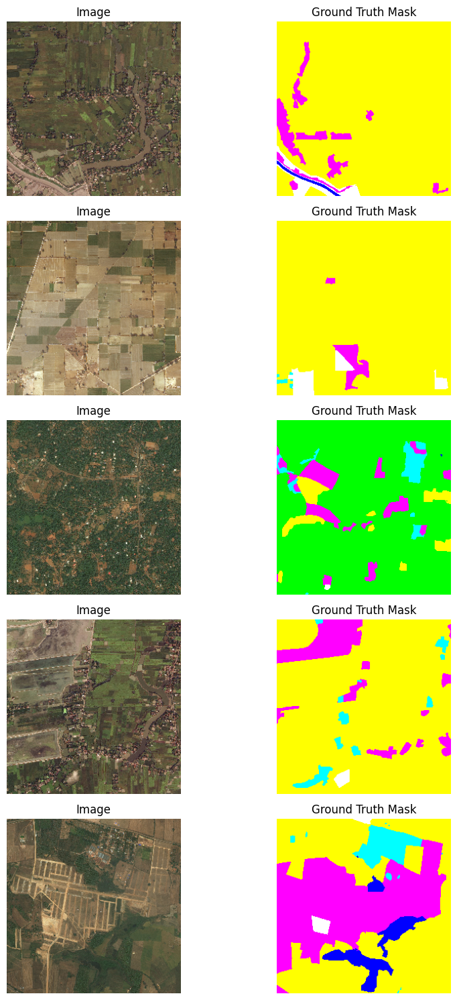

In [9]:
plt.figure(figsize=(10, 15))  

for i in range(5):
    idx = random.randint(0, len(X_train) - 1)
    image = X_train[idx]
    mask_one_hot = y_train[idx]
    mask_class = np.argmax(mask_one_hot, axis=-1)
    mask_rgb = class_to_rgb(mask_class)

    plt.subplot(5, 2, 2*i + 1)
    plt.imshow(image)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(5, 2, 2*i + 2)
    plt.imshow(mask_rgb)
    plt.title("Ground Truth Mask")
    plt.axis("off")

plt.subplots_adjust(wspace=0.05, hspace=0.2)
plt.tight_layout()
plt.show()

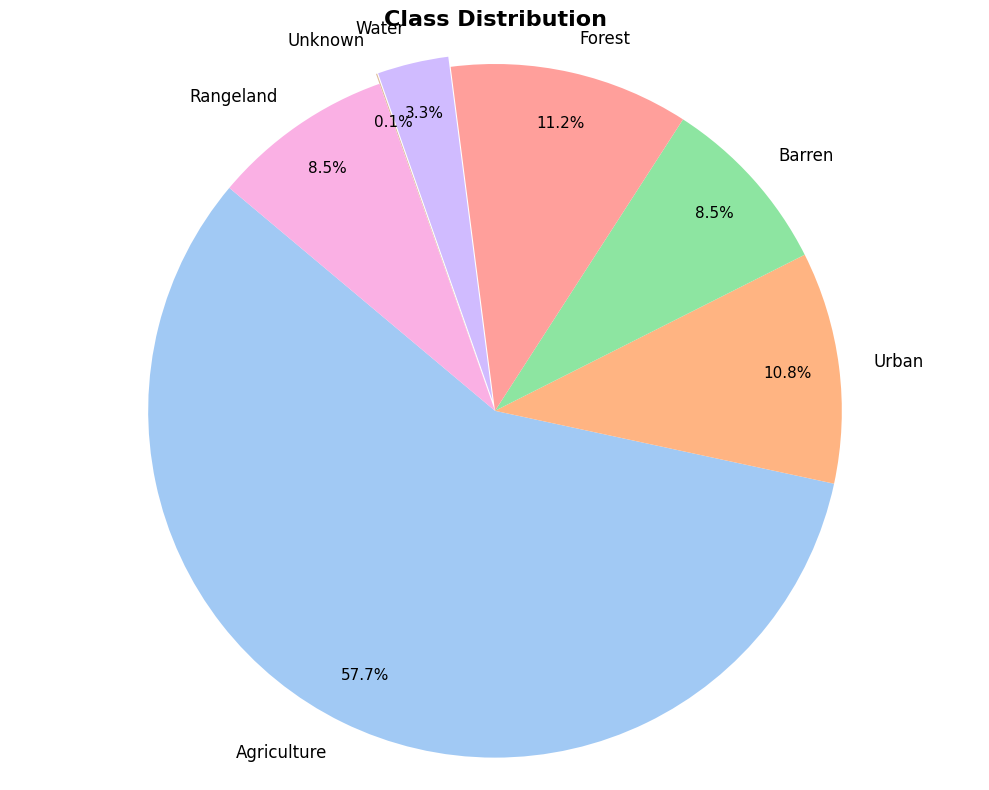

In [10]:
sns.set_palette("pastel")

flat_y_train = np.argmax(y_train, axis=-1).flatten()
train_counts = dict(collections.Counter(flat_y_train))

class_names = ['Urban', 'Agriculture', 'Rangeland', 'Forest', 'Water', 'Barren', 'Unknown']

labels = [class_names[i] for i in train_counts.keys()]
sizes = [train_counts[i] for i in train_counts.keys()]
colors = sns.color_palette("pastel")[0:len(sizes)]

explode = [0.03 if s / sum(sizes) < 0.08 else 0 for s in sizes]  

plt.figure(figsize=(10, 8))
wedges, texts, autotexts = plt.pie(
    sizes,
    labels=labels,
    colors=colors,
    autopct='%1.1f%%',
    startangle=140,
    textprops={'fontsize': 12},
    explode=explode,
    pctdistance=0.85,
    labeldistance=1.1
)

for autotext in autotexts:
    autotext.set_fontsize(11)
    autotext.set_color('black')

plt.title('Class Distribution', fontsize=16, fontweight='bold')
plt.axis('equal')
plt.tight_layout()
plt.show()

## Train-Validation Split and Class Distribution

In [11]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [12]:
flat_y_train = np.argmax(y_train, axis=-1).flatten()
flat_y_val = np.argmax(y_val, axis=-1).flatten()

print("Train class distribution:", dict(collections.Counter(flat_y_train)))
print("Val class distribution:", dict(collections.Counter(flat_y_val)))

Train class distribution: {1: 27272822, 3: 5532405, 5: 3900098, 0: 5023253, 6: 26693, 2: 4000920, 4: 1560801}
Val class distribution: {1: 3113619, 0: 660475, 2: 464194, 5: 547115, 4: 182482, 3: 340404, 6: 127}


## Handling the "Unknown" Class

In [13]:
def replace_unknown_class(mask, unknown_class=6):
    new_mask = mask.copy()
    known_mask = (mask != unknown_class)

    if known_mask.sum() == 0:
        return new_mask  

    distances, indices = distance_transform_edt(known_mask == 0, return_indices=True)
    new_mask[~known_mask] = mask[indices[0][~known_mask], indices[1][~known_mask]]

    return new_mask

In [14]:
y_train_indices = np.argmax(y_train, axis=-1)
y_val_indices = np.argmax(y_val, axis=-1)

y_train_cleaned = np.array([replace_unknown_class(mask) for mask in y_train_indices])
y_val_cleaned = np.array([replace_unknown_class(mask) for mask in y_val_indices])

y_train = tf.keras.utils.to_categorical(y_train_cleaned, num_classes=6)
y_val = tf.keras.utils.to_categorical(y_val_cleaned, num_classes=6)

In [15]:
y_train_labels = np.argmax(y_train, axis=-1).flatten()

classes = np.unique(y_train_labels)

class_weights_array = compute_class_weight(
    class_weight='balanced',
    classes=classes,
    y=y_train_labels
)

class_weights_dict = {i: w for i, w in zip(classes, class_weights_array)}

print("Class Weights:", class_weights_dict)

Class Weights: {0: 1.5698241247276024, 1: 0.28895872624172547, 2: 1.9690190199687534, 3: 1.425141148241631, 4: 5.047010149700509, 5: 2.0218562367120305}


## U-Net Model Architecture

In [16]:
inputs = Input(shape=(256, 256, 3))

c1 = Conv2D(64, 3, padding="same")(inputs)
c1 = LeakyReLU(alpha=0.1)(c1)
c1 = BatchNormalization()(c1)
c1 = Conv2D(64, 3, padding="same")(c1)
c1 = LeakyReLU(alpha=0.1)(c1)
c1 = BatchNormalization()(c1)
p1 = MaxPooling2D(pool_size=(2, 2))(c1)

c2 = Conv2D(128, 3, padding="same")(p1)
c2 = LeakyReLU(alpha=0.1)(c2)
c2 = BatchNormalization()(c2)
c2 = Conv2D(128, 3, padding="same")(c2)
c2 = LeakyReLU(alpha=0.1)(c2)
c2 = BatchNormalization()(c2)
p2 = MaxPooling2D(pool_size=(2, 2))(c2)

c3 = Conv2D(256, 3, padding="same")(p2)
c3 = LeakyReLU(alpha=0.1)(c3)
c3 = BatchNormalization()(c3)
c3 = Conv2D(256, 3, padding="same")(c3)
c3 = LeakyReLU(alpha=0.1)(c3)
c3 = BatchNormalization()(c3)
p3 = MaxPooling2D(pool_size=(2, 2))(c3)

c4 = Conv2D(512, 3, padding="same")(p3)
c4 = LeakyReLU(alpha=0.1)(c4)
c4 = BatchNormalization()(c4)
c4 = Conv2D(512, 3, padding="same")(c4)
c4 = LeakyReLU(alpha=0.1)(c4)
c4 = BatchNormalization()(c4)
p4 = MaxPooling2D(pool_size=(2, 2))(c4)

b = Conv2D(1024, 3, padding="same")(p4)
b = LeakyReLU(alpha=0.1)(b)
b = BatchNormalization()(b)
b = Conv2D(1024, 3, padding="same")(b)
b = LeakyReLU(alpha=0.1)(b)
b = BatchNormalization()(b)

u1 = Conv2DTranspose(512, 2, strides=2, padding="same")(b)
u1 = concatenate([u1, c4])
c5 = Conv2D(512, 3, padding="same")(u1)
c5 = LeakyReLU(alpha=0.1)(c5)
c5 = BatchNormalization()(c5)
c5 = Conv2D(512, 3, padding="same")(c5)
c5 = LeakyReLU(alpha=0.1)(c5)
c5 = BatchNormalization()(c5)

u2 = Conv2DTranspose(256, 2, strides=2, padding="same")(c5)
u2 = concatenate([u2, c3])
c6 = Conv2D(256, 3, padding="same")(u2)
c6 = LeakyReLU(alpha=0.1)(c6)
c6 = BatchNormalization()(c6)
c6 = Conv2D(256, 3, padding="same")(c6)
c6 = LeakyReLU(alpha=0.1)(c6)
c6 = BatchNormalization()(c6)

u3 = Conv2DTranspose(128, 2, strides=2, padding="same")(c6)
u3 = concatenate([u3, c2])
c7 = Conv2D(128, 3, padding="same")(u3)
c7 = LeakyReLU(alpha=0.1)(c7)
c7 = BatchNormalization()(c7)
c7 = Conv2D(128, 3, padding="same")(c7)
c7 = LeakyReLU(alpha=0.1)(c7)
c7 = BatchNormalization()(c7)

u4 = Conv2DTranspose(64, 2, strides=2, padding="same")(c7)
u4 = concatenate([u4, c1])
c8 = Conv2D(64, 3, padding="same")(u4)
c8 = LeakyReLU(alpha=0.1)(c8)
c8 = BatchNormalization()(c8)
c8 = Conv2D(64, 3, padding="same")(c8)
c8 = LeakyReLU(alpha=0.1)(c8)
c8 = BatchNormalization()(c8)

outputs = Conv2D(6, (1, 1), activation="softmax")(c8)

model = Model(inputs=inputs, outputs=outputs)

early_stopping = EarlyStopping(monitor='val_dice_coefficient', mode='max', patience=10, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

I0000 00:00:1753337972.073326      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1753337972.074056      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


In [17]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 256, 256,  │          0 │ conv2d[0][0]      │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        256 │ leaky_re_lu[0][0] │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 256, 256,  │          0 │ conv2d_1[0][0]    │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ leaky_re_lu_1[0]… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 128, 128,  │          0 │ conv2d_2[0][0]    │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ leaky_re_lu_2[0]… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 128, 128,  │          0 │ conv2d_3[0][0]    │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ leaky_re_lu_3[0]… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_4       │ (None, 64, 64,    │          0 │ conv2d_4[0][0]  

 Total params: 31,055,622 (118.47 MB)

 Trainable params: 31,043,846 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

## Custom Loss Functions & Evaluation Metrics

In [18]:
def dice_coefficient(y_true, y_pred, smooth=1):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def iou_metric(y_true, y_pred, smooth=1):
    y_true = K.cast(y_true, 'float32')  
    y_pred = K.cast(y_pred, 'float32')  
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

In [19]:
def weighted_dice_loss(class_weights, smooth=1e-6):
    def loss(y_true, y_pred):
        y_true = K.cast(y_true, 'float32')
        y_pred = K.cast(y_pred, 'float32')

        num_classes = y_pred.shape[-1]
        dice_per_class = []

        for i in range(num_classes):
            y_true_f = K.flatten(y_true[..., i])
            y_pred_f = K.flatten(y_pred[..., i])
            intersection = K.sum(y_true_f * y_pred_f)
            dice = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
            weighted_dice = (1 - dice) * class_weights.get(i, 1.0)
            dice_per_class.append(weighted_dice)

        return K.mean(K.stack(dice_per_class))
    
    return loss

## Model Compilation and Training

In [20]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-4), loss=weighted_dice_loss(class_weights_dict),
              metrics=[dice_coefficient, iou_metric])

In [21]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=16,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/100


I0000 00:00:1753337990.391817     105 service.cc:148] XLA service 0x7803e40016a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1753337990.392740     105 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1753337990.392770     105 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1753337991.521015     105 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-07-24 06:19:57.420945: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng12{k11=0} for conv (f32[16,128,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[16,128,128,128]{3,2,1,0}, f32[128,128,3,3]{3,2,1,0}, f32[128]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest

45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 974ms/step - dice_coefficient: 0.2291 - iou_metric: 0.1306 - loss: 1.6557

E0000 00:00:1753338118.628206     107 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1753338118.935080     107 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1753338123.825567     107 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1753338124.056568     107 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


46/46 ━━━━━━━━━━━━━━━━━━━━ 170s 2s/step - dice_coefficient: 0.2310 - iou_metric: 0.1318 - loss: 1.6496 - val_dice_coefficient: 0.1739 - val_iou_metric: 0.0953 - val_loss: 1.8579 - learning_rate: 1.0000e-04
Epoch 2/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - dice_coefficient: 0.3424 - iou_metric: 0.2078 - loss: 1.3508 - val_dice_coefficient: 0.2189 - val_iou_metric: 0.1231 - val_loss: 1.8637 - learning_rate: 1.0000e-04
Epoch 3/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 44s 963ms/step - dice_coefficient: 0.4141 - iou_metric: 0.2627 - loss: 1.2111 - val_dice_coefficient: 0.1674 - val_iou_metric: 0.0916 - val_loss: 1.8712 - learning_rate: 1.0000e-04
Epoch 4/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 45s 977ms/step - dice_coefficient: 0.4761 - iou_metric: 0.3140 - loss: 1.1403 - val_dice_coefficient: 0.1226 - val_iou_metric: 0.0655 - val_loss: 1.8738 - learning_rate: 1.0000e-04
Epoch 5/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 45s 977ms/step - dice_coefficient: 0.5179 - iou_metric: 0.3510 - loss: 1.1370 - val_dice_coefficie

## U-Net Model Evaluation

In [22]:
best_dice = max(history.history['val_dice_coefficient'])
best_iou = max(history.history['val_iou_metric'])

print(f"Best Validation Dice Coefficient: {best_dice:.4f}")
print(f"Best Validation IoU metric: {best_iou:.4f}")

Best Validation Dice Coefficient: 0.8254
Best Validation IoU metric: 0.7038


In [23]:
def plot_training_metrics(history):
    metrics = [key for key in history.history.keys() if not key.startswith('val_')]
    val_metrics = [f"val_{m}" for m in metrics if f"val_{m}" in history.history]

    num_metrics = len(metrics)
    plt.figure(figsize=(6 * num_metrics, 5))

    for i, metric in enumerate(metrics):
        plt.subplot(1, num_metrics, i + 1)
        plt.plot(history.history[metric], label=f"Train {metric}")
        if f"val_{metric}" in history.history:
            plt.plot(history.history[f"val_{metric}"], label=f"Val {metric}")
        plt.title(metric)
        plt.xlabel("Epoch")
        plt.ylabel(metric)
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

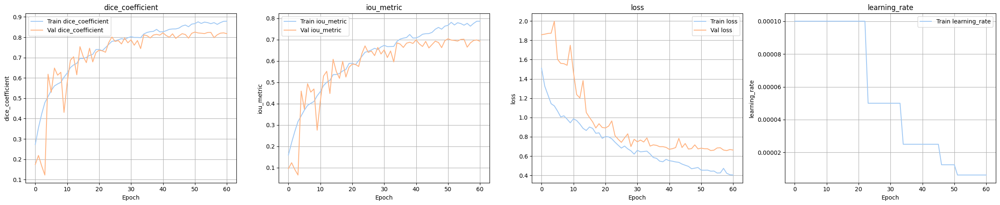

In [24]:
plot_training_metrics(history)

In [25]:
def dice_score_per_class(y_true, y_pred, num_classes):
    dice_scores = []
    for i in range(num_classes):
        y_true_i = (y_true == i).astype(np.uint8)
        y_pred_i = (y_pred == i).astype(np.uint8)

        intersection = np.sum(y_true_i * y_pred_i)
        union = np.sum(y_true_i) + np.sum(y_pred_i)

        dice = (2. * intersection) / (union + 1e-7)
        dice_scores.append(dice)
    return dice_scores


def iou_per_class(y_true, y_pred, num_classes):
    iou_scores = []
    for i in range(num_classes):
        y_true_i = (y_true == i).astype(np.uint8)
        y_pred_i = (y_pred == i).astype(np.uint8)

        intersection = np.sum(y_true_i * y_pred_i)
        union = np.sum(y_true_i + y_pred_i > 0)

        iou = intersection / (union + 1e-7)
        iou_scores.append(iou)
    return iou_scores

In [26]:
def evaluate_segmentation(model, X_val, y_val, class_names):
    y_pred = model.predict(X_val)
    y_pred_class = np.argmax(y_pred, axis=-1)
    y_true_class = np.argmax(y_val, axis=-1)

    y_pred_flat = y_pred_class.flatten()
    y_true_flat = y_true_class.flatten()

    num_classes = len(class_names)

    dice = dice_score_per_class(y_true_flat, y_pred_flat, num_classes)
    iou = iou_per_class(y_true_flat, y_pred_flat, num_classes)

    print("Class-wise Metrics:")
    for i, name in enumerate(class_names):
        print(f"{name:15s} | Dice: {dice[i]:.4f} | IoU: {iou[i]:.4f}")

    return dice, iou

In [27]:
class_names = [
    "Urban land", "Agriculture land", "Rangeland",
    "Forest land", "Water", "Barren land"
]

dice_unet, iou_unet = evaluate_segmentation(model, X_val, y_val, class_names)

2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 724ms/step

E0000 00:00:1753340903.816573     106 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1753340904.060073     106 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


3/3 ━━━━━━━━━━━━━━━━━━━━ 65s 13s/step
Class-wise Metrics:
Urban land      | Dice: 0.8196 | IoU: 0.6944
Agriculture land | Dice: 0.8912 | IoU: 0.8037
Rangeland       | Dice: 0.4350 | IoU: 0.2780
Forest land     | Dice: 0.7329 | IoU: 0.5784
Water           | Dice: 0.8159 | IoU: 0.6891
Barren land     | Dice: 0.7680 | IoU: 0.6234


In [28]:
def print_pixel_counts(model, X_val, y_val, class_names):
    y_pred = model.predict(X_val)
    y_pred_class = np.argmax(y_pred, axis=-1)
    y_true_class = np.argmax(y_val, axis=-1)

    print("Pixel Count Per Class:\n")
    for i, class_name in enumerate(class_names):
        gt_count = np.sum(y_true_class == i)
        pred_count = np.sum(y_pred_class == i)
        print(f"{class_name:15s} | Ground Truth: {gt_count:7d} | Predicted: {pred_count:7d}")

In [29]:
print_pixel_counts(model, X_val, y_val, class_names)

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 549ms/step
Pixel Count Per Class:

Urban land      | Ground Truth:  660549 | Predicted:  605233
Agriculture land | Ground Truth: 3113630 | Predicted: 3334024
Rangeland       | Ground Truth:  464198 | Predicted:  373120
Forest land     | Ground Truth:  340404 | Predicted:  401780
Water           | Ground Truth:  182483 | Predicted:  133184
Barren land     | Ground Truth:  547152 | Predicted:  461075


In [30]:
def visualize_predictions(model, X_val, y_val, class_to_rgb, num_samples=10):
    y_pred = model.predict(X_val)
    y_pred_class = np.argmax(y_pred, axis=-1)
    y_true_class = np.argmax(y_val, axis=-1)

    indices = np.random.choice(len(X_val), num_samples, replace=False)
    plt.figure(figsize=(12, num_samples * 3))

    for i, idx in enumerate(indices):
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(X_val[idx])
        plt.title("Image")
        plt.axis("off")

        gt_mask_rgb = class_to_rgb(y_true_class[idx])
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(gt_mask_rgb)
        plt.title("Ground Truth")
        plt.axis("off")

        pred_mask_rgb = class_to_rgb(y_pred_class[idx])
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(pred_mask_rgb)
        plt.title("Predicted")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 548ms/step


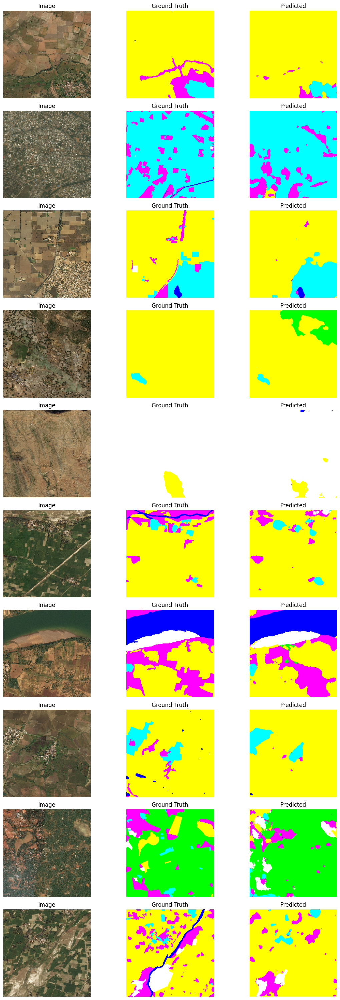

In [31]:
visualize_predictions(model, X_val, y_val, class_to_rgb, num_samples=10)

## Test Image Preprocessing

In [32]:
IMG_SIZE = (256, 256)

preprocess_images = []

for img_path in tqdm(test_image_paths):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    img = img / 255.0
    preprocess_images.append(img)

X_test = np.array(preprocess_images, dtype=np.float32)

print("X_test shape:", X_test.shape)

100%|██████████| 172/172 [00:11<00:00, 14.74it/s]

X_test shape: (172, 256, 256, 3)


## Visualizing U-Net Model Predictions on Unlabeled Test Set

In [33]:
def visualize_test_predictions(model, X_test, class_to_rgb, num_samples=5):
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=-1)

    indices = np.random.choice(len(X_test), num_samples, replace=False)
    plt.figure(figsize=(10, num_samples * 3))

    for i, idx in enumerate(indices):
        plt.subplot(num_samples, 2, i * 2 + 1)
        plt.imshow(X_test[idx])
        plt.title("Image")
        plt.axis("off")

        plt.subplot(num_samples, 2, i * 2 + 2)
        mask_rgb = class_to_rgb(y_pred_classes[idx])
        plt.imshow(mask_rgb)
        plt.title("Predicted Mask")
        plt.axis("off")

    plt.subplots_adjust(wspace=0.05, hspace=0.2)
    plt.tight_layout()
    plt.show()

5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 727ms/step

E0000 00:00:1753340949.623192     104 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1753340949.864738     104 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


6/6 ━━━━━━━━━━━━━━━━━━━━ 25s 5s/step 


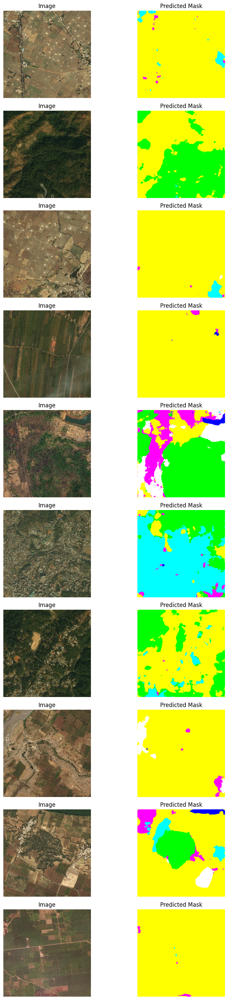

In [34]:
visualize_test_predictions(model, X_test, class_to_rgb, num_samples=10)

In [35]:
K.clear_session()

## Building a VGG16-based Semantic Segmentation Model (U-Net Style)

In [36]:
inputs = Input(shape=(256, 256, 3))

base_model = VGG16(include_top=False, weights='imagenet', input_tensor=inputs)

for layer in base_model.layers:
    layer.trainable = True

b1 = base_model.get_layer("block1_conv2").output  
b2 = base_model.get_layer("block2_conv2").output  
b3 = base_model.get_layer("block3_conv3").output  
b4 = base_model.get_layer("block4_conv3").output  
bridge = base_model.get_layer("block5_conv3").output  

u1 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bridge)
u1 = concatenate([u1, b4])
c1 = Conv2D(512, (3, 3), padding='same', activation='relu')(u1)
c1 = BatchNormalization()(c1)
c1 = Conv2D(512, (3, 3), padding='same', activation='relu')(c1)
c1 = BatchNormalization()(c1)

u2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c1)
u2 = concatenate([u2, b3])
c2 = Conv2D(256, (3, 3), padding='same', activation='relu')(u2)
c2 = BatchNormalization()(c2)
c2 = Conv2D(256, (3, 3), padding='same', activation='relu')(c2)
c2 = BatchNormalization()(c2)

u3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c2)
u3 = concatenate([u3, b2])
c3 = Conv2D(128, (3, 3), padding='same', activation='relu')(u3)
c3 = BatchNormalization()(c3)
c3 = Conv2D(128, (3, 3), padding='same', activation='relu')(c3)
c3 = BatchNormalization()(c3)

u4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c3)
u4 = concatenate([u4, b1])
c4 = Conv2D(64, (3, 3), padding='same', activation='relu')(u4)
c4 = BatchNormalization()(c4)
c4 = Conv2D(64, (3, 3), padding='same', activation='relu')(c4)
c4 = BatchNormalization()(c4)

outputs = Conv2D(6, (1, 1), activation='softmax')(c4)

vgg_model = Model(inputs=inputs, outputs=outputs)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [37]:
vgg_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 256, 256,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 128, 128,  │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 128, 128,  │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 128, 128,  │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 64, 64,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 64, 64,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 64, 64,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 64, 64,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 32, 32,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 32, 32,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 32, 32,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 32, 32,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 16, 16,    │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 16, 16,    │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 16, 16,    │  2,359,808 │ block5_conv1[0][

 Total params: 25,862,662 (98.66 MB)

 Trainable params: 25,858,822 (98.64 MB)

 Non-trainable params: 3,840 (15.00 KB)

## Compiling and Training the VGG16-Based U-Net Model

In [38]:
vgg_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss=weighted_dice_loss(class_weights_dict),
              metrics=[dice_coefficient, iou_metric])

In [39]:
vgg_history = vgg_model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=16,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 103s 2s/step - dice_coefficient: 0.2062 - iou_metric: 0.1155 - loss: 1.6939 - val_dice_coefficient: 0.1917 - val_iou_metric: 0.1072 - val_loss: 1.5640 - learning_rate: 1.0000e-04
Epoch 2/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 45s 974ms/step - dice_coefficient: 0.3372 - iou_metric: 0.2039 - loss: 1.3290 - val_dice_coefficient: 0.2425 - val_iou_metric: 0.1395 - val_loss: 1.3573 - learning_rate: 1.0000e-04
Epoch 3/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 44s 950ms/step - dice_coefficient: 0.4125 - iou_metric: 0.2611 - loss: 1.1781 - val_dice_coefficient: 0.3414 - val_iou_metric: 0.2076 - val_loss: 1.1812 - learning_rate: 1.0000e-04
Epoch 4/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 44s 957ms/step - dice_coefficient: 0.4494 - iou_metric: 0.2910 - loss: 1.1329 - val_dice_coefficient: 0.3797 - val_iou_metric: 0.2362 - val_loss: 1.1778 - learning_rate: 1.0000e-04
Epoch 5/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 44s 959ms/step - dice_coefficient: 0.4908 - iou_metric: 0.3275 - loss: 1.1121 - val

## VGG16 Model Evaluation

In [40]:
best_dice = max(vgg_history.history['val_dice_coefficient'])
best_iou = max(vgg_history.history['val_iou_metric'])

print(f"Best Validation Dice Coefficient: {best_dice:.4f}")
print(f"Best Validation IoU metric: {best_iou:.4f}")

Best Validation Dice Coefficient: 0.8499
Best Validation IoU metric: 0.7400


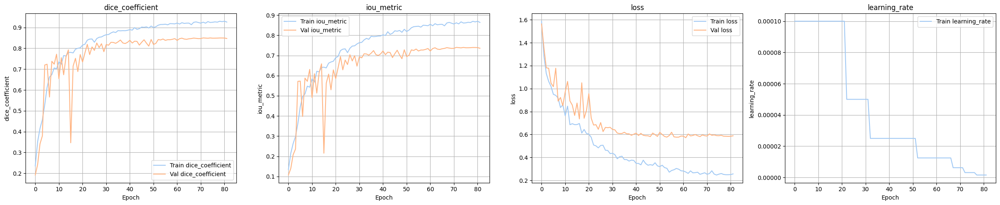

In [41]:
plot_training_metrics(vgg_history)

In [42]:
dice_vgg, iou_vgg = evaluate_segmentation(vgg_model, X_val, y_val, class_names)

3/3 ━━━━━━━━━━━━━━━━━━━━ 56s 12s/step
Class-wise Metrics:
Urban land      | Dice: 0.8248 | IoU: 0.7018
Agriculture land | Dice: 0.9030 | IoU: 0.8231
Rangeland       | Dice: 0.4042 | IoU: 0.2533
Forest land     | Dice: 0.7781 | IoU: 0.6368
Water           | Dice: 0.8624 | IoU: 0.7581
Barren land     | Dice: 0.7976 | IoU: 0.6633


In [43]:
print_pixel_counts(vgg_model, X_val, y_val, class_names)

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 554ms/step
Pixel Count Per Class:

Urban land      | Ground Truth:  660549 | Predicted:  597208
Agriculture land | Ground Truth: 3113630 | Predicted: 3411511
Rangeland       | Ground Truth:  464198 | Predicted:  266237
Forest land     | Ground Truth:  340404 | Predicted:  351720
Water           | Ground Truth:  182483 | Predicted:  154324
Barren land     | Ground Truth:  547152 | Predicted:  527416


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 554ms/step


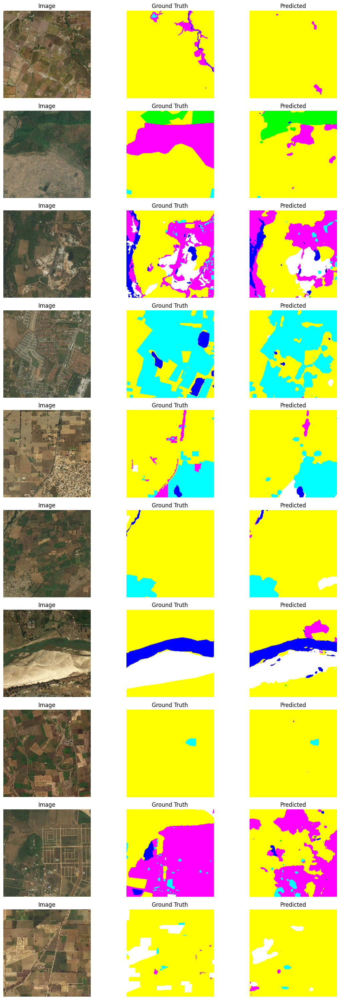

In [44]:
visualize_predictions(vgg_model, X_val, y_val, class_to_rgb, num_samples=10)

## Visualizing VGG16 Model Predictions on Unlabeled Test Set

6/6 ━━━━━━━━━━━━━━━━━━━━ 21s 4s/step 


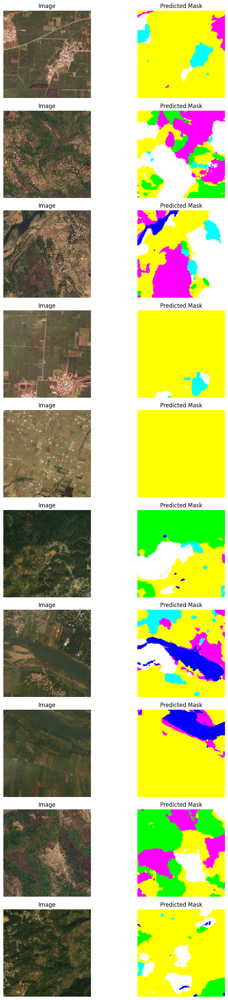

In [45]:
visualize_test_predictions(vgg_model, X_test, class_to_rgb, num_samples=10)

## Comparing: VGG16 vs U-Net

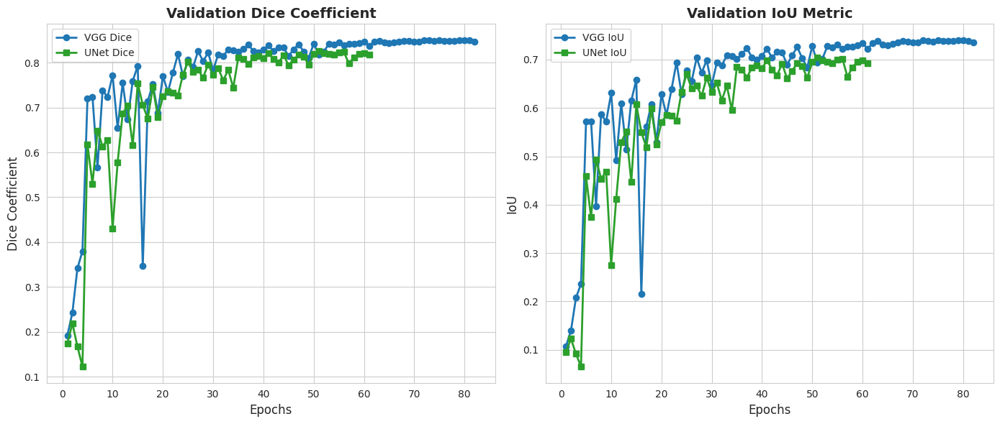

In [46]:
vgg_dice = vgg_history.history['val_dice_coefficient']
vgg_iou = vgg_history.history['val_iou_metric']
epochs_vgg = list(range(1, len(vgg_dice)+1))

unet_dice = history.history['val_dice_coefficient']
unet_iou = history.history['val_iou_metric']
epochs_unet = list(range(1, len(unet_dice)+1))

sns.set_style("whitegrid")
plt.figure(figsize=(14, 6))

vgg_color = '#1f77b4'  
unet_color = '#2ca02c'  

plt.subplot(1, 2, 1)
plt.plot(epochs_vgg, vgg_dice, marker='o', color=vgg_color, linewidth=2, label='VGG Dice')
plt.plot(epochs_unet, unet_dice, marker='s', color=unet_color, linewidth=2, label='UNet Dice')
plt.title('Validation Dice Coefficient', fontsize=14, fontweight='bold')
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Dice Coefficient', fontsize=12)
plt.legend(fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.subplot(1, 2, 2)
plt.plot(epochs_vgg, vgg_iou, marker='o', color=vgg_color, linewidth=2, label='VGG IoU')
plt.plot(epochs_unet, unet_iou, marker='s', color=unet_color, linewidth=2, label='UNet IoU')
plt.title('Validation IoU Metric', fontsize=14, fontweight='bold')
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('IoU', fontsize=12)
plt.legend(fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.tight_layout()
plt.show()

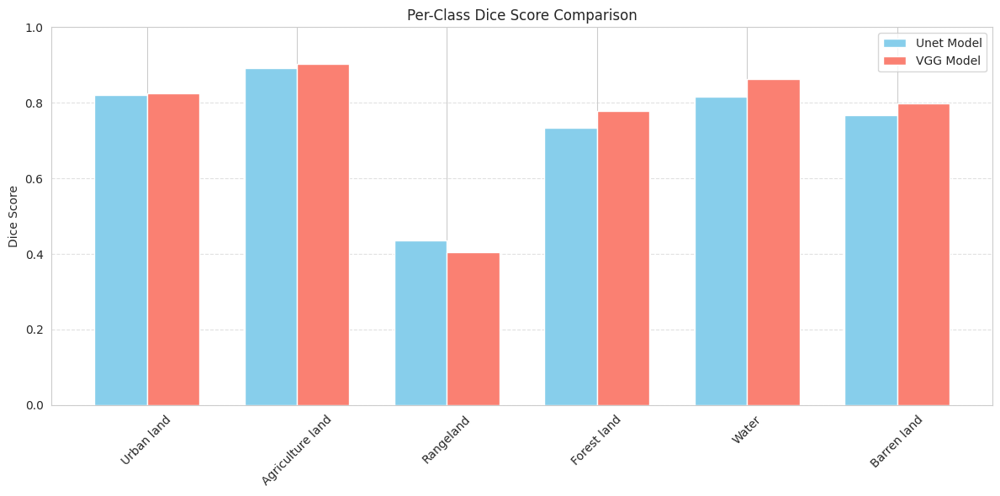

In [47]:
x = np.arange(len(class_names))  
width = 0.35  

plt.figure(figsize=(12, 6))
plt.bar(x - width/2, dice_unet, width, label='Unet Model', color='skyblue')
plt.bar(x + width/2, dice_vgg, width, label='VGG Model', color='salmon')

plt.xticks(x, class_names, rotation=45)
plt.ylabel("Dice Score")
plt.title("Per-Class Dice Score Comparison")
plt.legend()
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

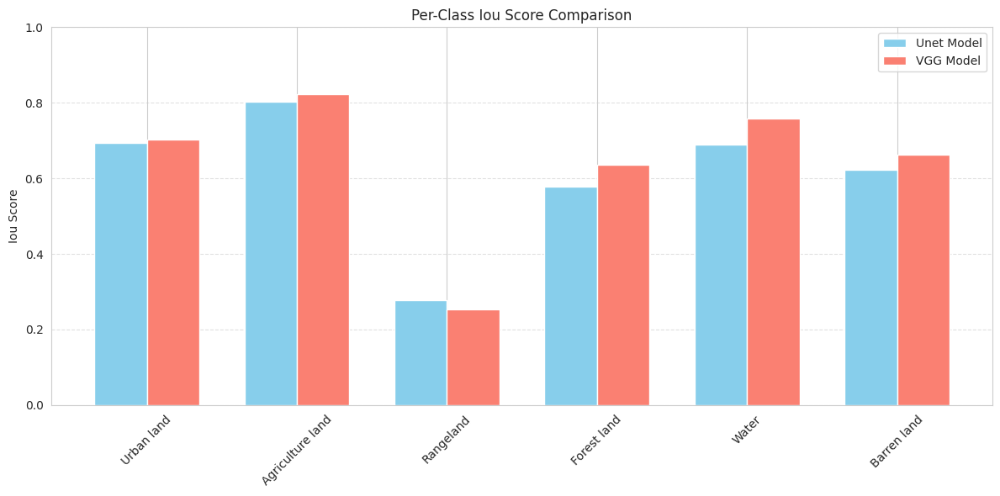

In [48]:
plt.figure(figsize=(12, 6))
plt.bar(x - width/2, iou_unet, width, label='Unet Model', color='skyblue')
plt.bar(x + width/2, iou_vgg, width, label='VGG Model', color='salmon')

plt.xticks(x, class_names, rotation=45)
plt.ylabel("Iou Score")
plt.title("Per-Class Iou Score Comparison")
plt.legend()
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()